<a href="https://colab.research.google.com/github/YounseoKim62/python_for_DA/blob/main/3_franchise_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 내용
- pandas를 사용하여 원하는 columns만 가져오기
- pandas를 사용하여 새로운 column 생성
- folium의 plugins를 사용하여 지도에 다양한 시각화

## 패키지 불러오기

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## 한글폰트 설정

In [2]:
import matplotlib as mpl
import matplotlib.font_manager as fm

!apt-get update -qq
!apt-get install fonts-nanum* -qq

fe = fm.FontEntry(fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', name='NanumGothic')
fm.fontManager.ttflist.insert(0, fe)

plt.rcParams.update({'font.size': 10, 'font.family': 'NanumGothic'})

mpl.rcParams['axes.unicode_minus'] = False # 음수가 깨질때

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package fonts-nanum.
(Reading database ... 123594 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Selecting previously unselected package fonts-nanum-coding.
Preparing to unpack .../fonts-nanum-coding_2.5-3_all.deb ...
Unpacking fonts-nanum-coding (2.5-3) ...
Selecting previously unselected package fonts-nanum-eco.
Preparing to unpack .../fonts-nanum-eco_1.000-7_all.deb ...
Unpacking fonts-nanum-eco (1.000-7) ...
Selecting previously unselected package fonts-nanum-extra.
Preparing to unpack .../fonts-nanum-extra_20200506-1_all.deb ...
Unpacking fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Setting up fo

## 데이터 불러오기

### 데이터 파일을 불러오고 확인

In [3]:
from google.colab import drive
drive.mount('/content/drive')

df = pd.read_csv('/content/drive/MyDrive/데이터 분석/공부/3. 프랜차이즈 입점 분석/상가업소정보_201912_01.csv',
                 sep = '|')

df.head()

Mounted at /content/drive


,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
1,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
2,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
3,19912201,싱싱커피&토스트,NaN,Q,음식,Q07,패스트푸드,Q07A10,토스트전문,I56192,...,2653010400105780000002037,산업용품유통상가,부산광역시 사상구 괘감로 37,617726,46977.0,NaN,1,26,128.980455,35.159774
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249


### 데이터 요약

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     573680 non-null  int64  
 1   상호명        573679 non-null  object 
 2   지점명        76674 non-null   object 
 3   상권업종대분류코드  573680 non-null  object 
 4   상권업종대분류명   573680 non-null  object 
 5   상권업종중분류코드  573680 non-null  object 
 6   상권업종중분류명   573680 non-null  object 
 7   상권업종소분류코드  573680 non-null  object 
 8   상권업종소분류명   573680 non-null  object 
 9   표준산업분류코드   539290 non-null  object 
 10  표준산업분류명    539290 non-null  object 
 11  시도코드       573680 non-null  int64  
 12  시도명        573680 non-null  object 
 13  시군구코드      573680 non-null  int64  
 14  시군구명       573680 non-null  object 
 15  행정동코드      573680 non-null  int64  
 16  행정동명       573680 non-null  object 
 17  법정동코드      573680 non-null  int64  
 18  법정동명       573680 non-null  object 
 19  지번코드       573680 non-n

### 결측치 확인

In [5]:
# mean()을 사용하면 결측치의 비율을 확인 할 수 있음
n = df.isnull().mean()
n

,0
상가업소번호,0.000000
상호명,0.000002
지점명,0.866347
상권업종대분류코드,0.000000
상권업종대분류명,0.000000
상권업종중분류코드,0.000000
상권업종중분류명,0.000000
상권업종소분류코드,0.000000
상권업종소분류명,0.000000
표준산업분류코드,0.059946


Text(0, 0.5, 'columns')

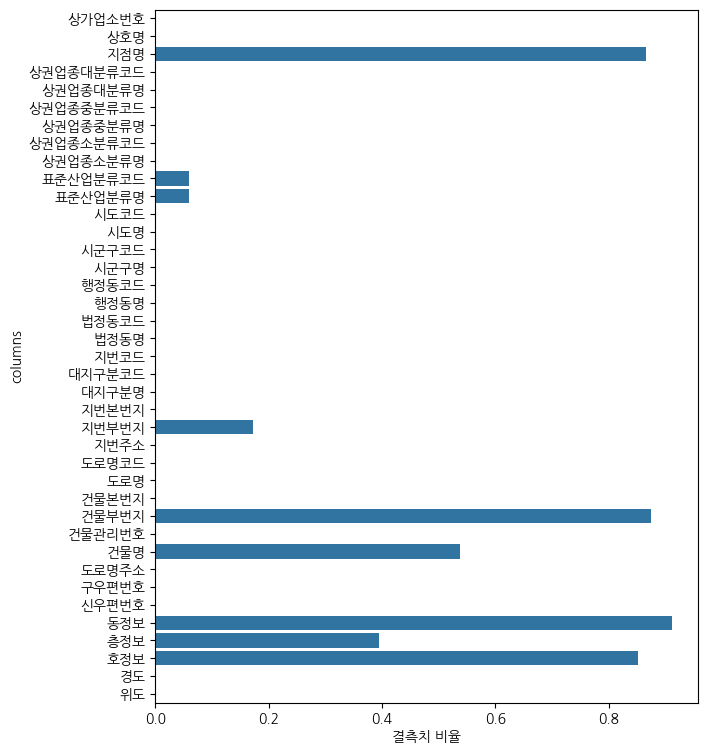

In [9]:
plt.figure(figsize = (7, 9))
sns.barplot(x = n.values,
            y = n.index,
            orient = 'h')
plt.xlabel('결측치 비율')
plt.ylabel('columns')

### 필요한 columns 따로 저장하기

In [10]:
columns = ['상호명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명',
           '시도명', '시군구명', '행정동명', '법정동명', '도로명주소',
           '경도', '위도']
df = df[columns].copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       573679 non-null  object 
 1   상권업종대분류명  573680 non-null  object 
 2   상권업종중분류명  573680 non-null  object 
 3   상권업종소분류명  573680 non-null  object 
 4   시도명       573680 non-null  object 
 5   시군구명      573680 non-null  object 
 6   행정동명      573680 non-null  object 
 7   법정동명      573680 non-null  object 
 8   도로명주소     573680 non-null  object 
 9   경도        573680 non-null  float64
 10  위도        573680 non-null  float64
dtypes: float64(2), object(9)
memory usage: 48.1+ MB


## 인덱싱을 사용하여 서브셋 만들기

### 서울만 따로 보기

In [11]:
df_seoul = df[df['시도명'] == '서울특별시'].copy()
df_seoul.head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
4,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
5,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


In [12]:
df_seoul['시군구명'].unique()

array(['강남구', '금천구', '송파구', '광진구', '강서구', '중구', '서초구', '성북구', '구로구',
       '영등포구', '서대문구', '동대문구', '노원구', '동작구', '성동구', '관악구', '강동구', '양천구',
       '종로구', '강북구', '은평구', '중랑구', '도봉구', '마포구', '용산구'], dtype=object)

In [13]:
df_seoul['시군구명'].nunique()

25

## 서브셋을 파일로 저장하기

In [14]:
df_seoul.to_csv('/content/drive/MyDrive/데이터 분석/공부/3. 프랜차이즈 입점 분석/seoul_open_store.csv', index=False)

In [15]:
# 제대로 저장이 되었는지 확인
pd.read_csv('/content/drive/MyDrive/데이터 분석/공부/3. 프랜차이즈 입점 분석/seoul_open_store.csv').head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
3,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
4,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


## 베스킨라빈스, 던킨도너츠 위치 분석

### 베스킨라빈스와 던킨도너츠만 가져오기

In [16]:
# 영어로 등록된 column에는 소문자와 대문자가 섞여있을 수 있으니
# '상호명_소문자' column을 생성
df_seoul['상호명_소문자'] = df_seoul['상호명'].str.lower()

In [17]:
# str.extract('정규표현식')는 column의 데이터에 정규표현식 내용이 포함되어있으면
# 포함되는 부분만 return, 포함되지 않는 경우에는 NaN값을 return

# 따로 column을 지정해주지 않으면 '0'이라는 column을 새로 생성
df_seoul['상호명_소문자'].str.extract('(베스킨라빈스|배스킨라빈스|baskinrobbins)')[0].value_counts()

,count
0,
배스킨라빈스,347
베스킨라빈스,117
baskinrobbins,2


In [18]:
# contains()를 사용하여 혹시 놓친것이 없는지 extract()의 결과와 비교
df_seoul.loc[df_seoul['상호명_소문자'].str.contains('(베스킨라빈스|배스킨라빈스|baskinrobbins)'),
             '상호명_소문자'].shape

<ipython-input-18-f7cdb50935ef>:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df_seoul.loc[df_seoul['상호명_소문자'].str.contains('(베스킨라빈스|배스킨라빈스|baskinrobbins)'),


(466,)

In [19]:
df_seoul['상호명_소문자'].str.extract('(던킨|dunkin)')[0].value_counts()

,count
0,
던킨,190
dunkin,1


In [20]:
df_seoul.loc[df_seoul['상호명_소문자'].str.contains('던킨|dunkin'),
             '상호명_소문자'].shape

(191,)

In [21]:
# '상호명_소문자' column에
# '배스킨|베스킨|baskin|던킨|dunkin'을 포함하는 데이터만 df_31 변수에 저장
df_31 = df_seoul[df_seoul['상호명_소문자'].str.contains('배스킨라빈스|베스킨라빈스|baskinrobbins|던킨|dunkin')].copy()
df_31.shape

(657, 12)

In [22]:
# '상호명_소문자' column에
# 배스킨라빈스|베스킨라빈스|baskinrobbins|던킨|dunkin'을 포함하는 데이터의
# '브랜드명'을 '배스킨라빈스'로 저장
df_31.loc[df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"),
          "브랜드명"] = '배스킨라빈스'
df_31[["상호명", "브랜드명"]].head()

,상호명,브랜드명
76,배스킨라빈스,배스킨라빈스
1167,던킨도너츠,nan
1819,던킨도너츠테크노마트점,nan
2164,베스킨라빈스,배스킨라빈스
2305,던킨도너츠창동하나로,nan


In [23]:
df_31.loc[df_31["상호명_소문자"].str.contains("던킨|dunkin"),
          "브랜드명"] = '던킨도너츠'
df_31[["상호명", "브랜드명"]].head()

,상호명,브랜드명
76,배스킨라빈스,배스킨라빈스
1167,던킨도너츠,던킨도너츠
1819,던킨도너츠테크노마트점,던킨도너츠
2164,베스킨라빈스,배스킨라빈스
2305,던킨도너츠창동하나로,던킨도너츠


In [24]:
# 데이터가 제대로 모아졌는지 확인
df_31["상권업종대분류명"].value_counts()

,count
상권업종대분류명,
음식,655
소매,1
생활서비스,1


In [25]:
# "상권업종대분류명" column 에서 isin 기능을 사용해서 "소매", "생활서비스" 인 데이터만 확인
df_31[df_31['상권업종대분류명'].isin(['소매', '생활서비스'])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
358699,배스킨라빈스,소매,종합소매점,할인점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 압구정로 204,127.029381,37.527375,배스킨라빈스,배스킨라빈스
556592,baskinrobbins,생활서비스,광고/인쇄,인쇄종합,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 강남대로 396,127.028289,37.498154,baskinrobbins,배스킨라빈스


In [26]:
# "상권업종대분류명"에서 "소매", "생활서비스"는 제거

# ~는 not을 의미
df_31 = df_31[~df_31["상권업종대분류명"].isin(["소매", "생활서비스"])].copy()
df_31.shape

(655, 13)

### 범주형 값으로 countplot 그리기

In [27]:
brand_count = df_31['브랜드명'].value_counts()
brand_count

,count
브랜드명,
배스킨라빈스,464
던킨도너츠,191


<Axes: ylabel='브랜드명'>

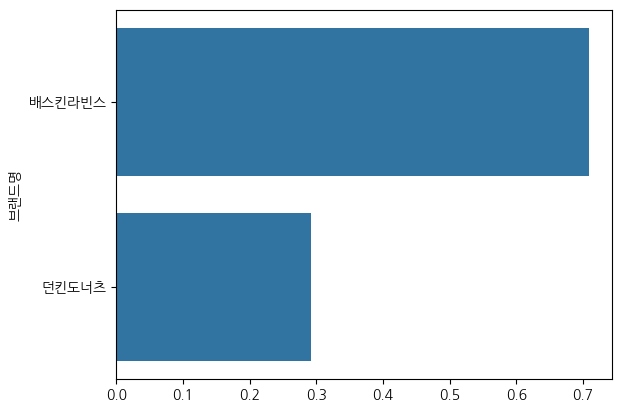

In [28]:
sns.barplot(x = df_31['브랜드명'].value_counts(normalize = True).values,
            y = df_31['브랜드명'].value_counts(normalize = True).index)

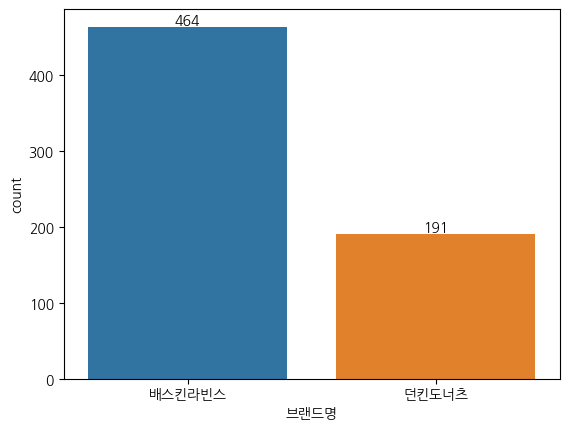

In [29]:
g = sns.countplot(data = df_31, x = '브랜드명', hue = '브랜드명')

# hue plot은 여러개의 container를 가지고 있기 때문에 g.containers가 반복되어야 한다
for container in g.containers:
    g.bar_label(container)

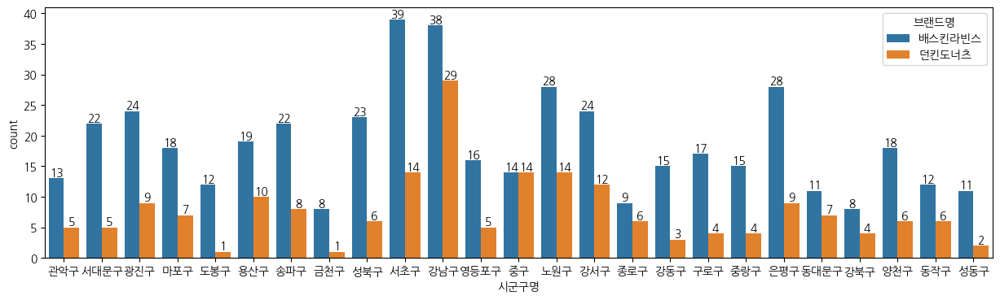

In [30]:
# 시군구별 배스킨라빈스와 던킨도너츠의 빈도수
plt.figure(figsize = (15, 4))
g = sns.countplot(data = df_31, x = '시군구명', hue = '브랜드명')

for container in g.containers:
  g.bar_label(container)

### scatterplot 그리기

<Axes: xlabel='경도', ylabel='위도'>

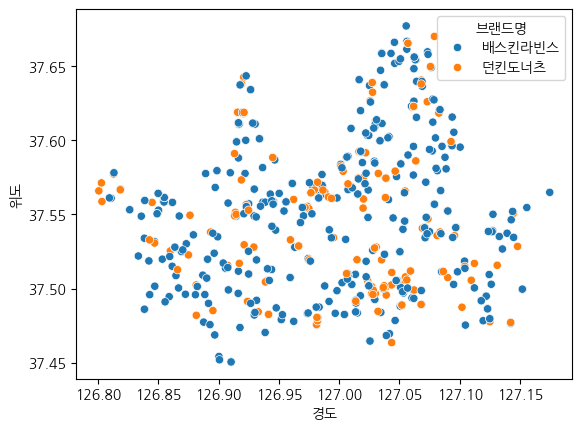

In [31]:
sns.scatterplot(data = df_31, x = '경도', y = '위도', hue = '브랜드명')

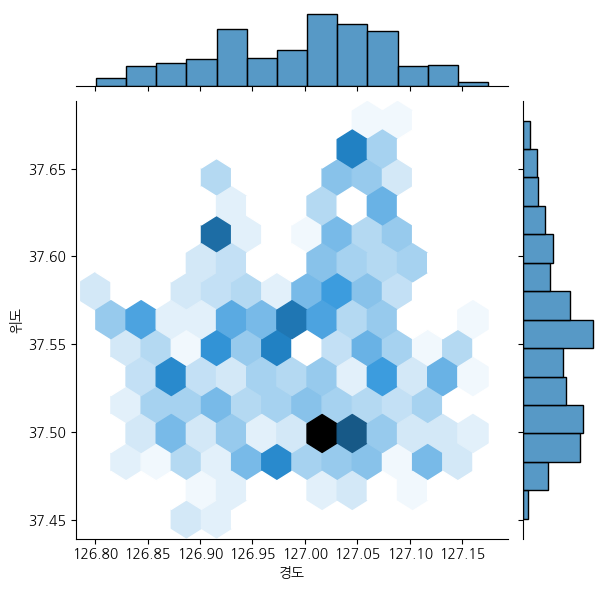

In [32]:
sns.jointplot(data = df_31, x = '경도', y = '위도', kind = 'hex')

### folium으로 지도에 표시

In [33]:
import folium

In [34]:
lat = df_31['위도'].mean()
long = df_31['경도'].mean()
lat, long

(37.548567678569114, 126.99419527148807)

In [35]:
# 지도에 표시할 데이터를 무작위로 1개 추출
df_31.sample(random_state = 31)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
276889,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 논현로 341,127.039032,37.495593,던킨도너츠,던킨도너츠


In [36]:
m = folium.Map(location = [lat, long], zoom_start = 12)

folium.Marker(
    [37.495593, 127.039032],
    popup = '<i>던킨도너츠<i>',
    tooltop = '던킨도너츠').add_to(m)

m

#### 기본마커로 표시하기

In [37]:
m = folium.Map([lat, long], zoom_start=12)

for i in df_31.index:

    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i, "도로명주소"]

    icon_color = "blue"
    if df_31.loc[i, "브랜드명"] == "던킨도너츠":
        icon_color = "red"

    popup = folium.Popup(f'<i>{title}<i>',
                         max_width = 600,
                         max_height = 600)

    folium.Marker(
        [sub_lat, sub_long],
        icon = folium.Icon(color=icon_color),
        popup = popup,
        tooltip = title).add_to(m)

m

#### MarkerCluster로 표시하기

In [38]:
from folium.plugins import MarkerCluster

MarkerCluster?

In [39]:
m = folium.Map([lat, long], zoom_start = 12)
marker_cluster = MarkerCluster().add_to(m)

for i in df_31.index:

  sub_lat = df_31.loc[i, '위도']
  sub_long = df_31.loc[i, '경도']
  title = df_31.loc[i, '상호명'] + ' - ' + df_31.loc[i, "도로명주소"]

  icon_color = 'blue'
  if df_31.loc[i, "브랜드명"] == '던킨도너츠':
    icon_color = 'red'

  folium.Marker(
      [sub_lat, sub_long],
      icon = folium.Icon(color = icon_color),
      popup = folium.Popup(f'<i>{title}<i>',
                           max_width = 600,
                           max_height = 600),
      tooltip = title).add_to(marker_cluster)

m

## 파리바게트, 뚜레쥬르 위치 분석

### 파리바게트와 뚜레쥬르만 가져오기

In [40]:
df_seoul['상호명'].str.extract("(뚜레쥬르|뚜레주르)")[0].value_counts()

,count
0,
뚜레쥬르,257
뚜레주르,1


In [41]:
df_seoul['상호명'].str.extract('(파리바게|파리크라상)')[0].value_counts()

,count
0,
파리바게,514
파리크라상,53


In [42]:
df_bread = df_seoul[df_seoul['상호명'].str.contains('뚜레(쥬|주)|파리(바게|크라상)')].copy()
df_bread.shape

<ipython-input-42-86cfdc6073e0>:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df_bread = df_seoul[df_seoul['상호명'].str.contains('뚜레(쥬|주)|파리(바게|크라상)')].copy()


(825, 12)

In [43]:
# 데이터를 제대로 가져왔는지 확인
df_bread['상권업종대분류명'].value_counts()

,count
상권업종대분류명,
음식,823
학문/교육,2


In [44]:
df_bread[df_bread['상권업종대분류명'].isin(['학문/교육'])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
354693,파리바게뜨교육소,학문/교육,학원-자격/국가고시,학원-제과기술,서울특별시,영등포구,영등포동,영등포동8가,서울특별시 영등포구 영중로 159,126.905405,37.530553,파리바게뜨교육소
406627,뚜레쥬르,학문/교육,학원-자격/국가고시,학원-제과기술,서울특별시,금천구,가산동,가산동,서울특별시 금천구 가산디지털1로 128,126.883684,37.477224,뚜레쥬르


In [45]:
df_bread = df_bread[~df_bread['상권업종대분류명'].isin(['학문/교육'])].copy()
df_bread.shape

(823, 12)

In [46]:
df_bread['상호명'].unique()

array(['뚜레쥬르', '파리바게뜨길동사거리점', '파리바게뜨상계제일점', '뚜레쥬르중계브라운', '파리바게뜨-판매옥수점',
       '파리바게뜨당고개점', '파리바게뜨목동오거리점', '뚜레쥬르신당역점', '파리바게뜨', '파리바게뜨서강신수점',
       '파리크라상', '파리바게뜨수유중앙점', '파리바게뜨가락중앙점', '파리바게뜨종로구기',
       '뚜레쥬르왕십리민자역사점왕십리민자역사점', '파리크라상교대역점', '뚜레쥬르도선사거리점', '여의도2호파리크라상',
       '목동파리크라상', '뚜레쥬르개봉역점', '파리바게뜨외대점', '파리크라상파스쿠찌홍', '파리크라상파스쿠찌압',
       'CJ뚜레쥬르', '신목파리바게뜨', '방주산업뚜레쥬르광화문경희궁의', '파리크라상파스쿠찌서', '파리크라상파스쿠찌도',
       '강동경희파리바게뜨', '파리크라상이대점', '파리크라상파스쿠찌압구정역2호', '뚜레쥬르송천센트레빌점',
       '파리크라상잠바주스디큐브', '파리크라상잠바주스대치역', '파리바게트', '상계뚜레쥬르', '뚜레쥬르대림3동점',
       '뚜레쥬르목4동점', '카페약수파리바게트', '파리바게뜨가좌역점', '파리바게뜨영등포구청점', '뚜레쥬르독산지식센터점',
       '파리바게뜨수락리버시티', '파리바게뜨방학중앙점', '파리바게뜨중계2호점', '뚜레쥬르방화역점', '파리바게뜨중앙대점',
       '뚜레쥬르레이크펠리스점', '파리바게뜨장안현대점', '뚜레쥬르우이점', '파리바게뜨성북점', '뚜레쥬르양천푸른점',
       '파리바게뜨마장대로점', '파리바게뜨문정역점', '뚜레쥬르엔시티보라매', '파리바게뜨종로시그니처점',
       '파리바게뜨상계보람점', '파리바게뜨성동세무서점', '파리바게뜨여의경도점', '파리바게뜨구로제일점',
       '뚜레쥬르창동SM마트', '파리바게뜨카페대학로점', '파리바게뜨대림역점', '파리바게뜨월계미성', '파리크라상서래점',
       '파리바게뜨금천한양점', '씨

In [47]:
df_bread[df_bread['상호명'].str.contains('파스쿠찌|잠바주스')]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
150108,파리크라상파스쿠찌홍,음식,커피점/카페,커피전문점/카페/다방,서울특별시,마포구,서강동,상수동,서울특별시 마포구 와우산로 94,126.924922,37.552600,파리크라상파스쿠찌홍
150916,파리크라상파스쿠찌압,음식,제과제빵떡케익,제과점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 논현로 868,127.028866,37.526073,파리크라상파스쿠찌압
165698,파리크라상파스쿠찌서,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로5가길 23,127.001032,37.578832,파리크라상파스쿠찌서
166894,파리크라상파스쿠찌도,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,삼성1동,삼성동,서울특별시 강남구 테헤란로87길 22,127.059427,37.509624,파리크라상파스쿠찌도
167937,파리크라상파스쿠찌서,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로 101,126.997184,37.580448,파리크라상파스쿠찌서
173293,파리크라상파스쿠찌압구정역2호,음식,제과제빵떡케익,제과점,서울특별시,강남구,신사동,신사동,서울특별시 강남구 압구정로 162,127.027449,37.526305,파리크라상파스쿠찌압구정역2호
173492,파리크라상잠바주스디큐브,음식,커피점/카페,생과일주스전문점,서울특별시,구로구,신도림동,신도림동,서울특별시 구로구 경인로 662,126.888485,37.508058,파리크라상잠바주스디큐브
173775,파리크라상잠바주스대치역,음식,제과제빵떡케익,제과점,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2942,127.062308,37.493635,파리크라상잠바주스대치역
263755,파리크라상잠바주스동,음식,제과제빵떡케익,제과점,서울특별시,용산구,이촌1동,이촌동,서울특별시 용산구 이촌로 245,126.974348,37.520170,파리크라상잠바주스동
267247,파리크라상잠바주스삼,음식,제과제빵떡케익,제과점,서울특별시,서초구,서초2동,서초동,서울특별시 서초구 서초대로78길 22,127.027528,37.495796,파리크라상잠바주스삼


In [48]:
df_bread = df_bread[~df_bread["상호명"].str.contains('파스쿠찌|잠바주스')].copy()
df_bread.shape

(812, 12)

In [49]:
# '브랜드명' column 생성
df_bread.loc[df_bread['상호명'].str.contains('파리바게'), '브랜드명'] = '파리바게뜨'
df_bread.loc[df_bread['상호명'].str.contains('파리크라상'), '브랜드명'] = '파리바게뜨'
df_bread.loc[df_bread['상호명'].str.contains('뚜레'), '브랜드명'] = '뚜레쥬르'
df_bread[["상호명", "브랜드명"]].head()

,상호명,브랜드명
2935,뚜레쥬르,뚜레쥬르
13843,뚜레쥬르,뚜레쥬르
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,뚜레쥬르


In [50]:
df_bread['브랜드명'].isnull().sum()

0

### countplot

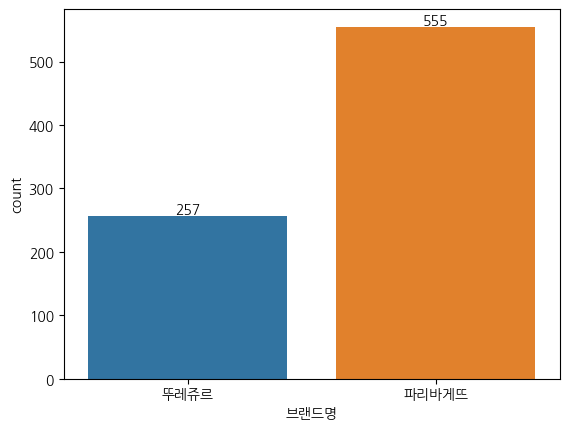

In [51]:
g = sns.countplot(data = df_bread, x = '브랜드명', hue = '브랜드명')
for container in g.containers:
  g.bar_label(container)

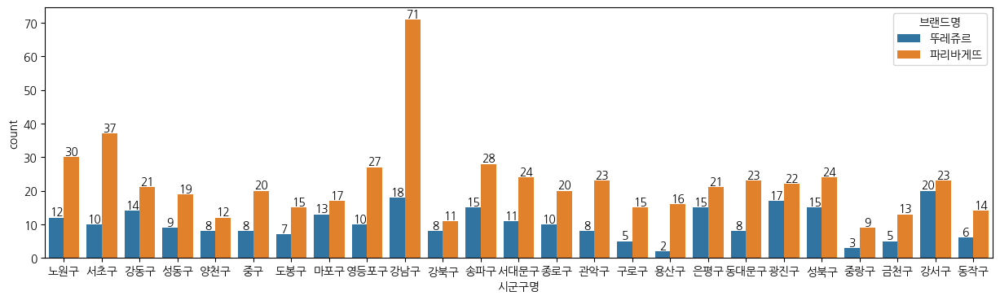

In [52]:
plt.figure(figsize = (15,4))
g = sns.countplot(data = df_bread, x = '시군구명', hue = '브랜드명')

for container in g.containers:
  g.bar_label(container)

### scatterplot

<Axes: xlabel='경도', ylabel='위도'>

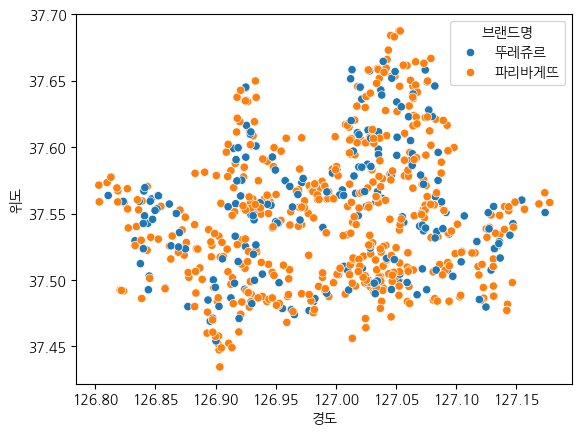

In [53]:
sns.scatterplot(data = df_bread, x = '경도', y = '위도', hue = '브랜드명')

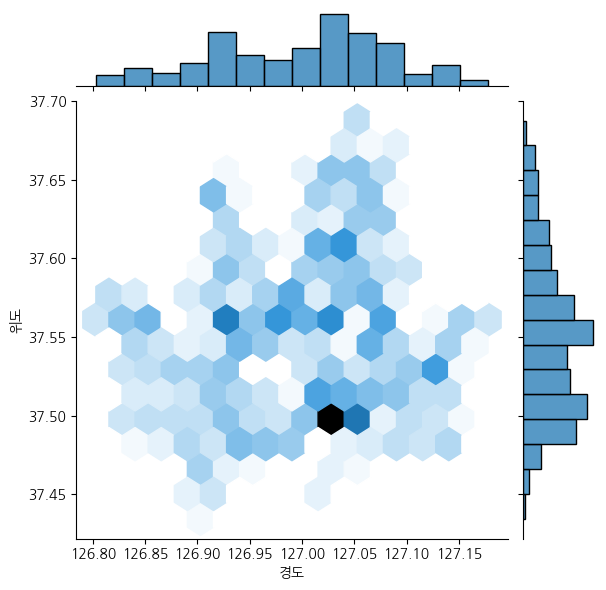

In [54]:
sns.jointplot(data = df_bread, x = '경도', y = '위도', kind = 'hex')

### folium으로 지도에 표시

#### CircleMarker로 표시하기

In [55]:
m = folium.Map([lat, long], zoom_start = 12)

for i in df_bread.index:

  sub_lat = df_bread.loc[i, '위도']
  sub_long = df_bread.loc[i, '경도']
  title = df_bread.loc[i, '상호명'] + ' - ' + df_bread.loc[i, '도로명주소']

  icon_color = 'blue'
  if df_bread.loc[i, '브랜드명'] == '뚜레쥬르':
    icon_color = 'green'

  popup = folium.Popup(f'<i>{title}<i>',
                       max_width = 600,
                       max_height = 600)

  folium.CircleMarker(
      [sub_lat, sub_long],
      radius = 5,
      color = icon_color,
      popup = popup,
      tooltip = title).add_to(m)

m

#### MarkerCluster로 표시하기

In [56]:
m = folium.Map([lat, long], zoom_start = 12)

marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index:

  sub_lat = df_bread.loc[i, '위도']
  sub_long = df_bread.loc[i, '경도']
  title = df_bread.loc[i, '상호명'] + ' - ' + df_bread.loc[i, '도로명주소']

  icon_color = 'blue'
  if df_bread.loc[i, '브랜드명'] == '뚜레쥬르':
    icon_color = 'green'

  popup = folium.Popup(f'<i>{title}<i>',
                       max_width = 600,
                       max_height = 600)

  folium.CircleMarker(
      [sub_lat, sub_long],
      radius = 5,
      color = icon_color,
      popup = popup,
      tooltip = title).add_to(marker_cluster)

m

#### Heatmap으로 표시하기

In [57]:
from folium.plugins import HeatMap

m = folium.Map([lat, long], zoom_start = 12)

for i in df_bread.index:

  sub_lat = df_bread.loc[i, '위도']
  sub_long = df_bread.loc[i, '경도']
  title = df_bread.loc[i, '상호명'] + ' - ' + df_bread.loc[i, '도로명주소']

  icon_color = 'blue'
  if df_bread.loc[i, '브랜드명'] == '뚜레쥬르':
    icon_color = 'green'

  popup = folium.Popup(f'<i>{title}<i>',
                       max_width = 600,
                       max_height = 600)

  folium.CircleMarker(
      [sub_lat, sub_long],
      radius = 3,
      color = icon_color,
      popup = popup,
      tooltip = title).add_to(m)

HeatMap(df_bread[['위도', '경도']]).add_to(m)

m

## 스타벅스, 이디야 위치 분석

### 스타벅스와 이디야만 가져오기

In [58]:
df_seoul['상호명_소문자'] = df_seoul['상호명'].str.lower()

In [59]:
df_seoul['상호명_소문자'].str.extract('(스타벅스|starbucks|이디야|이디아|ediya)').value_counts()

,count
0,
스타벅스,505
이디야,493
이디아,39
ediya,11
starbucks,1


In [60]:
df_seoul.loc[df_seoul['상호명_소문자'].str.contains('스타벅스|starbucks|이디야|이디아|ediya'),
             '상호명_소문자'].shape

(1049,)

In [61]:
df_coffee = df_seoul[df_seoul['상호명_소문자'].str.contains('스타벅스|starbucks|이디야|이디아|ediya')].copy()
df_coffee.shape

(1049, 12)

In [62]:
df_coffee.loc[df_coffee['상호명_소문자'].str.contains('스타벅스|starbucks'), '브랜드명'] = '스타벅스'
df_coffee.loc[df_coffee['상호명_소문자'].str.contains('이디야|이디아|ediya'), '브랜드명'] = '이디야'
df_coffee[['상호명_소문자', '브랜드명']].head()

,상호명_소문자,브랜드명
1104,스타벅스,스타벅스
1675,이디야커피,이디야
2023,스타벅스종로3가점,스타벅스
2770,스타벅스,스타벅스
2957,이디야커피,이디야


In [63]:
# 데이터가 제대로 모아졌는지 확인
df_coffee['상권업종대분류명'].value_counts()

,count
상권업종대분류명,
음식,1038
생활서비스,4
학문/교육,3
소매,3
부동산,1


In [64]:
df_coffee[df_coffee['상권업종대분류명'].isin(['생활서비스', '학문/교육', '소매', '부동산'])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
17340,대신이디아이서원주유소,생활서비스,주유소/충전소,주유소,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 반포대로 142,127.007552,37.492719,대신이디아이서원주유소,이디야
52253,이디아이박정어학원,학문/교육,학원-어학,학원-외국어/어학,서울특별시,마포구,서교동,노고산동,서울특별시 마포구 신촌로 94,126.935979,37.554989,이디아이박정어학원,이디야
122341,이디아이박정어학원,학문/교육,학원-어학,학원-외국어/어학,서울특별시,마포구,대흥동,노고산동,서울특별시 마포구 서강로 144,126.936609,37.554472,이디아이박정어학원,이디야
127080,스타벅스,생활서비스,광고/인쇄,인쇄종합,서울특별시,양천구,목1동,목동,서울특별시 양천구 목동동로 257,126.874682,37.527147,스타벅스,스타벅스
148794,이디아이박정어학원,학문/교육,학원-어학,학원-외국어/어학,서울특별시,마포구,대흥동,노고산동,서울특별시 마포구 백범로 8,126.936717,37.553996,이디아이박정어학원,이디야
148904,케이디아이종합건설,부동산,분양,주택공급,서울특별시,용산구,원효로1동,문배동,서울특별시 용산구 청파로 195,126.970474,37.537040,케이디아이종합건설,이디야
312709,이디아에어텍,생활서비스,주택수리,배관난방보일러,서울특별시,성북구,석관동,석관동,서울특별시 성북구 돌곶이로22길 5,127.058207,37.610198,이디아에어텍,이디야
341089,하이디아,소매,기타판매업,통신판매,서울특별시,종로구,창신1동,창신동,서울특별시 종로구 종로53길 27,127.013261,37.573591,하이디아,이디야
412704,스타벅스,생활서비스,광고/인쇄,인쇄종합,서울특별시,구로구,신도림동,신도림동,서울특별시 구로구 경인로 662,126.888485,37.508058,스타벅스,스타벅스
458966,이디아,소매,종합소매점,종합소매,서울특별시,중구,신당동,신당동,서울특별시 중구 청계천로 318,127.013758,37.569351,이디아,이디야


In [65]:
df_coffee = df_coffee[~df_coffee['상권업종대분류명'].isin(['생활서비스', '학문/교육', '소매', '부동산'])].copy()
df_coffee.shape

(1038, 13)

### countplot

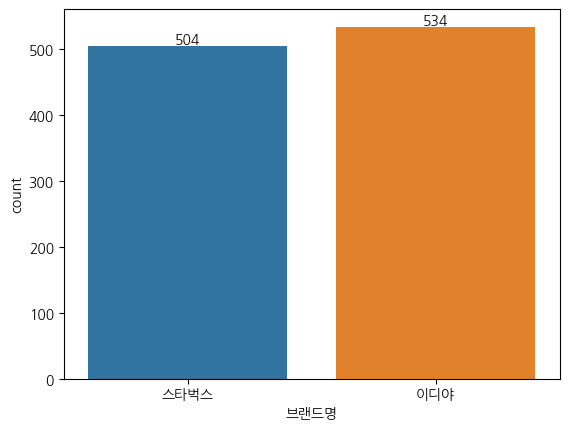

In [66]:
g = sns.countplot(data = df_coffee, x = '브랜드명', hue = '브랜드명')

for container in g.containers:
  g.bar_label(container)

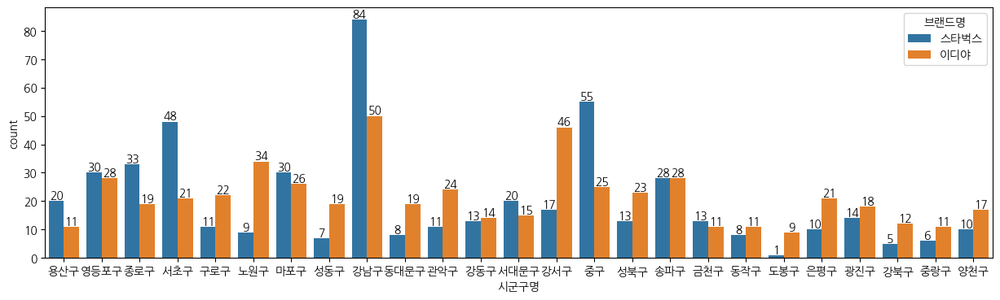

In [67]:
plt.figure(figsize = (15, 4))
g = sns.countplot(data = df_coffee,
                  x = '시군구명',
                  hue = '브랜드명')

for container in g.containers:
  g.bar_label(container)

### scatterplot

<Axes: xlabel='경도', ylabel='위도'>

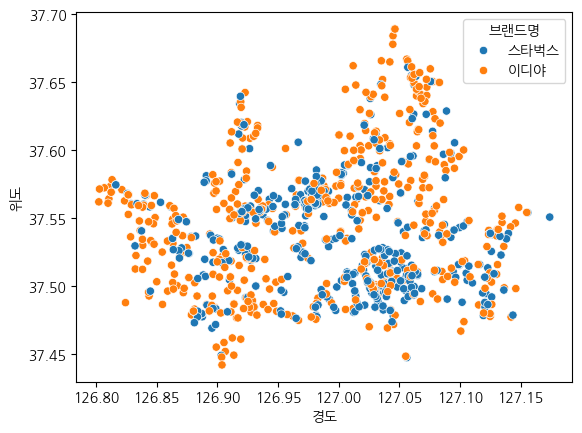

In [68]:
sns.scatterplot(data = df_coffee, x = '경도', y = '위도', hue = '브랜드명')

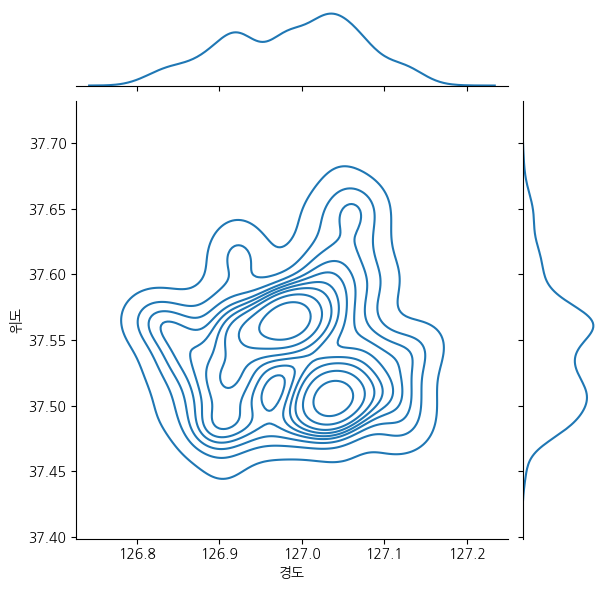

In [69]:
sns.jointplot(data = df_coffee, x = '경도', y = '위도', kind = 'kde')

### groupby와 pivot_table로 구별 스타벅스, 이디야 매장 수 구하기

In [70]:
# groupby를 사용해서 구별 브랜드별 점포수를 구함
df_coffee_gu = df_coffee.groupby(['시군구명', '브랜드명'])['상호명'].count()
df_coffee_gu.head()

시군구명  브랜드명
강남구   스타벅스    84
      이디야     50
강동구   스타벅스    13
      이디야     14
강북구   스타벅스     5
Name: 상호명, dtype: int64

In [71]:
# reset_index()를 사용하여 인덱스를 column으로 만듦
df_coffee_gu = df_coffee_gu.reset_index()
df_coffee_gu.head()

,시군구명,브랜드명,상호명
0,강남구,스타벅스,84
1,강남구,이디야,50
2,강동구,스타벅스,13
3,강동구,이디야,14
4,강북구,스타벅스,5


In [72]:
df_coffee_gu.columns = ['구', '브랜드명', '매장수']
df_coffee_gu.head()

,구,브랜드명,매장수
0,강남구,스타벅스,84
1,강남구,이디야,50
2,강동구,스타벅스,13
3,강동구,이디야,14
4,강북구,스타벅스,5


In [73]:
# pivot_table을 사용하여 구별 브랜드별 점포수를 구함
df_coffee_pivot = pd.pivot_table(data = df_coffee,
                                 index = ['시군구명', '브랜드명'],
                                 values = '상호명',
                                 aggfunc = 'count')

df_coffee_pivot = df_coffee_pivot.reset_index()
df_coffee_pivot.columns = ['구', '브랜드명', '매장수']
df_coffee_pivot.head()

,구,브랜드명,매장수
0,강남구,스타벅스,84
1,강남구,이디야,50
2,강동구,스타벅스,13
3,강동구,이디야,14
4,강북구,스타벅스,5


### barplot

<Axes: xlabel='구', ylabel='매장수'>

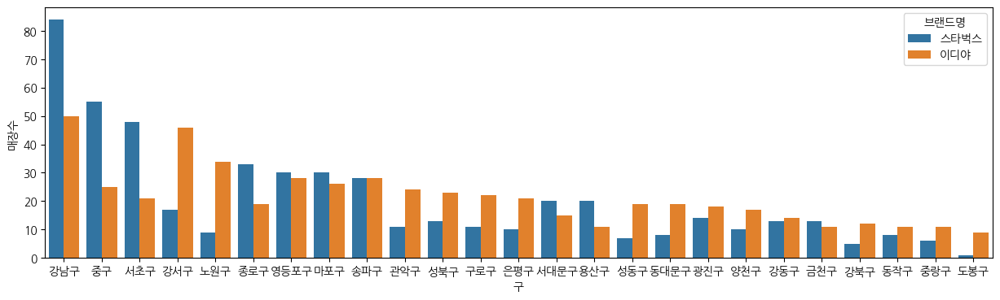

In [74]:
plt.figure(figsize = (15, 4))
sns.barplot(data = df_coffee_gu.sort_values('매장수', ascending = False),
            x = '구',
            y = '매장수',
            hue = '브랜드명')

<Axes: xlabel='구', ylabel='매장수'>

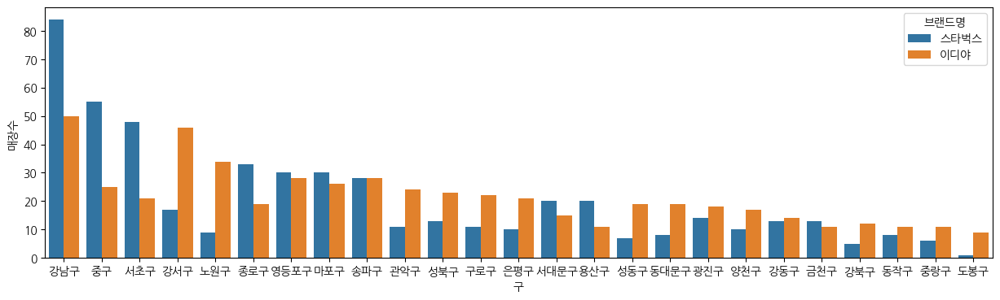

In [75]:
plt.figure(figsize = (15, 4))
sns.barplot(data = df_coffee_pivot.sort_values('매장수', ascending = False),
            x = '구',
            y = '매장수',
            hue = '브랜드명')

### folium으로 지도에 표시

In [76]:
import folium

In [77]:
lat = df_coffee['위도'].mean()
long = df_coffee['경도'].mean()

#### 기본마커로 표시하기

In [78]:
m = folium.Map([lat, long], zoom_start = 12)

for i in df_coffee.index:
  sub_lat = df_coffee.loc[i, '위도']
  sub_long = df_coffee.loc[i, '경도']

  title = df_coffee.loc[i, '상호명'] + ' - ' + df_coffee.loc[i, '도로명주소']

  icon_color = 'green'
  if df_coffee.loc[i, '브랜드명'] == '이디야':
    icon_color = 'blue'

  popup = folium.Popup(f'<i>{title}<i>',
                       max_height = 600,
                       max_width = 600)

  folium.Marker([sub_lat, sub_long],
                icon = folium.Icon(color = icon_color),
                popup = popup,
                tooltip = title).add_to(m)

m

#### choropleth

In [79]:
# 서울의 행정구역 경계를 GeoJSON으로 표현한 파일
import json
geo_json = json.load(open('/content/drive/MyDrive/데이터 분석/공부/3. 프랜차이즈 입점 분석/seoul_municipalities_geo_simple.json',
                          encoding = 'utf_8'))

In [80]:
# geo_json에서 구 이름 가져오기
geo_json['features'][0]['properties']['name']

'강동구'

In [81]:
# 스타벅스 매장만 가져오기
df_coffee_star = df_coffee_pivot[df_coffee_pivot['브랜드명'] == '스타벅스'].copy()
df_coffee_star.head()

,구,브랜드명,매장수
0,강남구,스타벅스,84
2,강동구,스타벅스,13
4,강북구,스타벅스,5
6,강서구,스타벅스,17
8,관악구,스타벅스,11


In [82]:
# 구별 스타벅스 매장수 choropleth
m = folium.Map([lat, long], zoom_start = 12)

folium.Choropleth(
    geo_data = geo_json,
    name = 'choropleth',
    data = df_coffee_star,
    columns = ['구', '매장수'],
    key_on = 'feature.properties.name',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = '스타벅스 매장수'
).add_to(m)

m

In [83]:
# 이디야 매장만 가져오기
df_coffee_edi = df_coffee_pivot[df_coffee_pivot['브랜드명'] == '이디야'].copy()
df_coffee_edi.head()

,구,브랜드명,매장수
1,강남구,이디야,50
3,강동구,이디야,14
5,강북구,이디야,12
7,강서구,이디야,46
9,관악구,이디야,24


In [84]:
# 구별 이디야 매장수 choropleth
m = folium.Map([lat, long], zoom_start = 12)

folium.Choropleth(
    geo_data = geo_json,
    name = 'choropleth',
    data = df_coffee_edi,
    columns = ['구', '매장수'],
    key_on = 'feature.properties.name',
    fill_color = 'Blues',
    fill_opcaity = 0.7,
    line_opacity = 0.2,
    legend_name = '이디야 매장수').add_to(m)

for i in df_coffee.index:
  sub_lat = df_coffee.loc[i, '위도']
  sub_long = df_coffee.loc[i, '경도']

  title = df_coffee.loc[i, '상호명'] + ' - ' + df_coffee.loc[i, '도로명주소']

  color = 'green'
  if df_coffee.loc[i, '브랜드명'] == '이디야':
    color = 'blue'

  popup = folium.Popup(f'{title}',
                       max_height = 600,
                       max_width = 600)

  folium.CircleMarker([sub_lat, sub_long],
                      radius = 3,
                      color = color,
                      popup = popup,
                      tooltip = title).add_to(m)

m

#### 매장수 크기를 반영한 CircleMarker

- Pandas의 reshaping data 활용
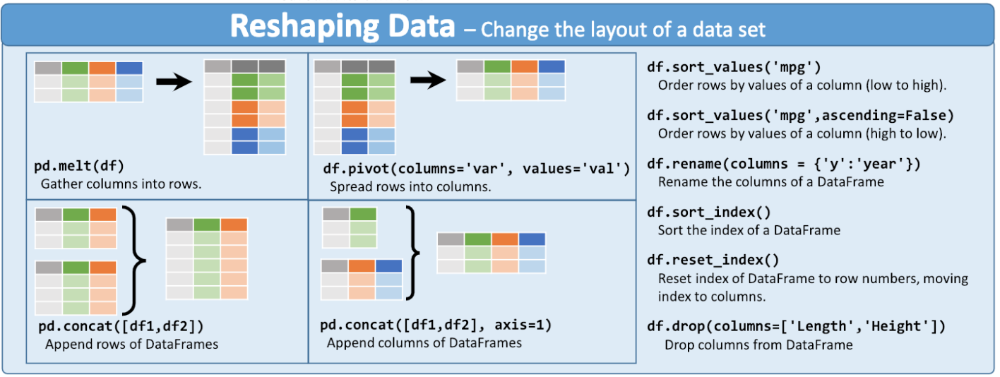

In [85]:
# 스타벅스가 이디야 보다 많은 구를 표
df_coffee_count = df_coffee_pivot.pivot(index = '구', columns = '브랜드명', values = '매장수')
df_coffee_count['매장수비교'] = df_coffee_count['스타벅스'] - df_coffee_count['이디야'] > 0
df_coffee_count.head()

브랜드명,스타벅스,이디야,매장수비교
구,,,
강남구,84,50,True
강동구,13,14,False
강북구,5,12,False
강서구,17,46,False
관악구,11,24,False


In [86]:
df_coffee_count = df_coffee_count.reset_index()
df_coffee_count.head()

브랜드명,구,스타벅스,이디야,매장수비교
0,강남구,84,50,True
1,강동구,13,14,False
2,강북구,5,12,False
3,강서구,17,46,False
4,관악구,11,24,False


#### choropleth

In [87]:
# 스타벅스의 매장수가 더 많은 구만 표시
m = folium.Map([lat, long], zoom_start = 12)

folium.Choropleth(
    geo_data = geo_json,
    name = 'choropleth',
    data = df_coffee_count,
    columns = ['구', '매장수비교'],
    key_on = 'feature.properties.name',
    fill_color = 'BuGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = '매장수 비교'
).add_to(m)

m

/usr/local/lib/python3.10/dist-packages/folium/features.py:1556: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  _, bin_edges = np.histogram(real_values, bins=bins)
